In [1]:

import numpy as np
import seaborn as sns
import pandas as pd
import matplotlib.pyplot as plt
import joblib

from PIL import *
import cv2

import time
import math

import torch
from torch import nn
from torch.optim import SGD
from torch.optim.lr_scheduler import ReduceLROnPlateau
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms
import pytorch_lightning as pl
from tqdm.cli import tqdm as tq

from statistics import mean
from typing import Tuple, Dict, Iterable

from pangu_dataset_mask import load_bounding_boxes, load_projected_ellipses, compute_mask, plot_ellipses, plot_masks
from pangu_dataset_mask import CraterDataset, get_ellipse_from_mask

from IPython.core.display import display, HTML
display(HTML("<style>.output_scroll { height: auto !important; }</style>"))

/tmp/ipykernel_4486/1173484754.py:28: DeprecationWarning: Importing display from IPython.core.display is deprecated since IPython 7.14, please import from IPython display
  from IPython.core.display import display, HTML


In [2]:
%load_ext autoreload

In [3]:
%reload_ext autoreload

In [4]:
autoreload 2

In [5]:
plt.rcParams['figure.figsize'] = [12, 6]
plt.rcParams['figure.dpi'] = 300

In [6]:
from torchvision.models.detection import maskrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor

In [7]:
import torchvision
from torchvision.models.detection import MaskRCNN
from torchvision.models.detection.anchor_utils import AnchorGenerator
### (Sofia): you could consider changing the model type from mobilenet_v2 to something else like resnet, densenet (sota), etc. 
###          If this happens then you will need to change the respective parameters, but Matt's suggestion is that this is not very important.

# load a pre-trained model for classification and return
# only the features
backbone = torchvision.models.mobilenet_v2(pretrained=True).features
# MaskRCNN needs to know the number of
# output channels in a backbone. For mobilenet_v2, it's 1280
# so we need to add it here
backbone.out_channels = 1280

# let's make the RPN generate 5 x 3 anchors per spatial
# location, with 5 different sizes and 3 different aspect
# ratios. We have a Tuple[Tuple[int]] because each feature
# map could potentially have different sizes and
# aspect ratios
anchor_generator = AnchorGenerator(sizes=((32, 64, 128, 256, 512),),
                                   aspect_ratios=((0.5, 1.0, 2.0),))

# let's define what are the feature maps that we will
# use to perform the region of interest cropping, as well as
# the size of the crop after rescaling.
# if your backbone returns a Tensor, featmap_names is expected to
# be ['0']. More generally, the backbone should return an
# OrderedDict[Tensor], and in featmap_names you can choose which
# feature maps to use.
roi_pooler = torchvision.ops.MultiScaleRoIAlign(featmap_names=['0'],
                                                output_size=7,
                                                sampling_ratio=2)

mask_roi_pooler = torchvision.ops.MultiScaleRoIAlign(featmap_names=['0'],
                                                     output_size=14,
                                                     sampling_ratio=2)
# put the pieces together inside a MaskRCNN model
model = MaskRCNN(backbone,
                 num_classes=2,
                 rpn_anchor_generator=anchor_generator,
                 box_roi_pool=roi_pooler,
                 mask_roi_pool=mask_roi_pooler)
model.eval()
x = [torch.rand(3, 300, 400), torch.rand(3, 500, 400)]
predictions = model(x)

/home/sofia/miniconda3/envs/pyenv/lib/python3.12/site-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/home/sofia/miniconda3/envs/pyenv/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MobileNet_V2_Weights.IMAGENET1K_V1`. You can also use `weights=MobileNet_V2_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


In [8]:
model = maskrcnn_resnet50_fpn(
    pretrained = True,
)

# Change number of output classes to two ( no-crater, crater )
in_features = model.roi_heads.box_predictor.cls_score.in_features 
model.roi_heads.box_predictor = FastRCNNPredictor( in_features, num_classes = 2 )

param_size = 0
for param in model.parameters():
    param_size += param.nelement() * param.element_size()
buffer_size = 0
for buffer in model.buffers():
    buffer_size += buffer.nelement() * buffer.element_size()

size_all_mb = ( param_size + buffer_size ) / 1024 ** 2
print('model size: {:.3f}MB'.format(size_all_mb))

/home/sofia/miniconda3/envs/pyenv/lib/python3.12/site-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=MaskRCNN_ResNet50_FPN_Weights.COCO_V1`. You can also use `weights=MaskRCNN_ResNet50_FPN_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


model size: 168.043MB


In [9]:
device = torch.device('cuda') if torch.cuda.is_available() else torch.device('cpu')
print(device)

cuda


In [10]:
# # boxes = load_bounding_boxes( [ '../data/LDEM_-90_-45E_0_45N/LDEM_-90_-45E_0_45N_float_60fov_1024_1024_20deg_off_nadir/ground_truth_bounding_boxes/10.txt' ] )
# # ellipses = load_projected_ellipses( '../data/LDEM_-90_-45E_0_45N/LDEM_-90_-45E_0_45N_float_60fov_1024_1024_20deg_off_nadir/ground_truth_projected_ellipses/10.txt' )
# # masks = compute_mask( ( 1024, 1024 ), ellipses['ellipse_sparse'] )
boxes = load_bounding_boxes( [ '../data/LDEM_-90_-45E_0_45N_all_ellipses/LDEM_-90_-45E_0_45N_all_ellipses_float_60fov_1024_1024_20deg_off_nadir/ground_truth_bounding_boxes/10.txt' ] )
ellipses = load_projected_ellipses( '../data/LDEM_-90_-45E_0_45N_all_ellipses/LDEM_-90_-45E_0_45N_all_ellipses_float_60fov_1024_1024_20deg_off_nadir/ground_truth_projected_ellipses/10.txt' )
masks = compute_mask( ( 1024, 1024 ), ellipses['ellipse_sparse'] )

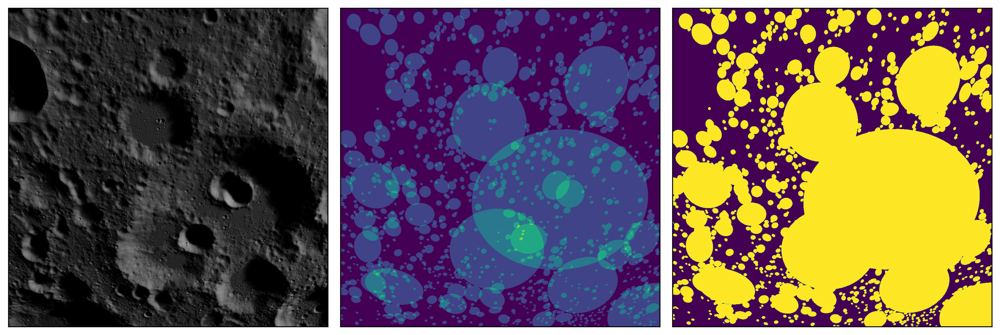

In [11]:
fig, ax = plt.subplots( ncols = 3 )

img = Image.open( '../data/LDEM_-90_-45E_0_45N_all_ellipses/LDEM_-90_-45E_0_45N_all_ellipses_float_60fov_1024_1024_20deg_off_nadir/ground_truth_images/10.png' )
ax[0].imshow( img )

# Second image is masks
img = np.zeros( ( 1024, 1024 ) )
for im in masks:
    img = img + im.numpy()
ax[1].imshow( img )

# Next show contours
ellipses = []
for im in masks:
    im = im.numpy()
    threshold = 0.5
    canny_output = cv2.Canny( cv2.merge( ( im, im, im ) ), threshold, threshold * 2 )
    contours, _ = cv2.findContours( canny_output, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE ) 
    
    for contour in contours:
        # Hopefully only ever one!
        if contour.shape[0] > 5:
            ellipses.append( cv2.fitEllipse( contour ) )

img = np.zeros( ( 1024, 1024 ) )
for ellipse in ellipses:
    cv2.ellipse(
        img,
        ( int( ellipse[0][0] ), int( ellipse[0][1] ) ),
        ( int( ellipse[1][0] / 2 ), int( ellipse[1][1] / 2 ) ),
        ellipse[2],
        0, # Start Angle for drawing
        360, # End Angle for drawing
        ( 1 ),
        -1, # Mask should be filled
    )
ax[2].imshow( img )

for i in range( 3 ):
    ax[i].set_xticks( [] )
    ax[i].set_yticks( [] )

fig.tight_layout()
plt.show()

In [12]:
# Load Robins crater database:
craters = pd.read_csv( '../data/craters_with_stats_-90_-45_0_90.csv' ).dropna()
craters = craters.loc[:, ~craters.columns.str.contains('^Unnamed')]
craters['medianDifference'] = ( craters['rimMedian'] - craters['fullMedian'] ).abs()

In [13]:
# Build CDA database (typically takes about a minute)
img_size = (1024, 1024)
root_dir = "../data/"
ldem_name = "LDEM_-90_-45E_0_45N_all_ellipses"
min_angle = 20
max_angle = 70 # 70 make it one more than what's avaliable
angle_inc = 5

# Limit number of craters per image (sorted from largest projected ellipse semi minor axis)
# If you want to use all filtered craters, set max_number_craters = -1

cd = CraterDataset(craters, img_size, root_dir, ldem_name, min_angle, max_angle, angle_inc, None, True, True)

Filter bad samples:


Total Images after Filtering 2500


Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..2.717647].
Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..2.6078432].


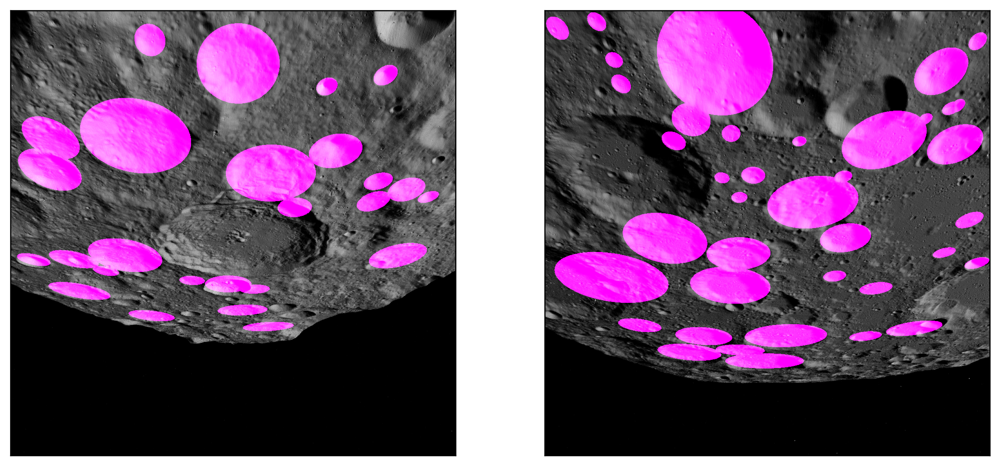

In [14]:
# Show a random sample of images
n_samples = 2
fig, ax = plt.subplots( ncols = n_samples )

for i in range( n_samples ):
    img, target = cd.__getitem__( int( np.random.rand() * cd.__len__() ) )
    img = img.numpy()[0]
    img = np.stack( ( img, img, img ), axis = 2 )

    for mask in target['masks']:
        img[:,:,0] += mask.numpy()
        img[:,:,2] += mask.numpy()

    ax[i].imshow( img )
    ax[i].set_xticks( [] )
    ax[i].set_yticks( [] )
    # ax[i].set_title( 'Angle: {angle:d}, Sample: {sample:d}'.format( angle = target['view_angle'][0].item(), sample = target['image_id'].item() ) )
plt.show()

In [15]:
# Return the batch as an iterable, skipping 'None' samples
def collate_fn(batch: Iterable):
    return tuple( zip( *( filter( lambda x:x is not None, batch ) ) ) )

In [16]:
# Split the dataset into train and test
trainIndices, testIndices = cd.testSplit()
print( 'Training samples:', len( trainIndices ) )
print( 'Testing samples:', len( testIndices ) )

dataset_train = torch.utils.data.Subset( cd, trainIndices )
dataset_test = torch.utils.data.Subset( cd, testIndices )

# define training and validation data loaders
### (Sofia): data loaders do a lot of useful things on their own.
data_loader = torch.utils.data.DataLoader(
    dataset_train,
    batch_size = 8,
    shuffle = True,
    num_workers = 16,
    collate_fn = collate_fn
)

data_loader_test = torch.utils.data.DataLoader(
    dataset_test,
    batch_size = 4,
    shuffle = False,
    num_workers = 8,
    collate_fn = collate_fn
)

Training samples: 1870
Testing samples: 630


In [17]:
initial_lr = 1e-2
momentum = 0.9
weight_decay = 0.0005

model.to( device )
params = [ p for p in model.parameters() if p.requires_grad ]
optimizer = SGD( params, lr = initial_lr, momentum = momentum, weight_decay = weight_decay )
scheduler = ReduceLROnPlateau( optimizer, patience = 5, cooldown = 2 )
# Early stopping????

In [18]:
# Make metrics dict with the required keys
### (Sofia): these metrics can be changed to something more useful. For example, we might not want objectness as in the results, it doesn't do much.
def init_run_metrics():
    return dict(
        train = dict(
            batch = list(),
            loss_total = list(),
            loss_classifier = list(),
            loss_box_reg = list(),
            loss_objectness = list(),
            loss_rpn_box_reg = list(),
            loss_mask = list(),
        ),
        valid = dict(
            batch = list(),
            loss_total = list(),
            loss_classifier = list(),
            loss_box_reg = list(),
            loss_objectness = list(),
            loss_rpn_box_reg = list(),
            loss_mask = list(),
        ),
    )

In [19]:
def target_to_device(target, device):
    target = [
        {
            k: (
                torch.tensor(v, device=device) if isinstance(v, (int, float, list)) and not isinstance(v, torch.Tensor)
                else v.to(device) if isinstance(v, torch.Tensor)
                else v  # Keep strings or unsupported types unchanged
            )
            for k, v in t.items()
        }
        for t in target
    ]
    return target

In [20]:
# model.train()
# # Debugging loop
# for img, target in data_loader:
#     try:
#         img = [image.to(device) for image in img]
#         target = target_to_device(target, device)
#         out = model(img, target)
#         break
#     except Exception as e:
#         print(f"Error encountered: {e}")

# for img, target in data_loader:
#     img = list( image.to( device ) for image in img )
#     # target = [{k: v.to(device) for k, v in t.items()} for t in target]
#     target = target_to_device(target, device)
#     out = model( img, target )
#     break

In [21]:
# out

In [23]:
model_name = 'mask_rcnn'

start_e = 1
EPOCHS = 30 #50

remove_loss_functions = ["loss_classifier","loss_objectness"]

In [24]:

run_metrics = init_run_metrics()

for e in range(start_e, EPOCHS + start_e):
    train_loader, validation_loader, test_loader = ( data_loader, data_loader_test, data_loader_test )

    print(f'\n-----Epoch {e} started-----\n')

    since = time.time()

    model.train()
    bar = tq( train_loader, desc = f"Training [{e}]",
                postfix = {
                    "loss_total": 0.,
                    "loss_classifier": 0.,
                    "loss_box_reg": 0.,
                    "loss_ellipse": 0.,
                    "loss_objectness": 0.,
                    "loss_rpn_box_reg": 0.,
                } )
    
    for batch, ( images, targets ) in enumerate( bar, 1 ):
        images = list( image.to( device ) for image in images )
        targets = target_to_device(targets, device)

        loss_dict = model( images, targets )
        loss = sum( l for l in loss_dict.values() )

        if not math.isfinite(loss):
            del images, targets
            raise RuntimeError(f"Loss is {loss}, stopping training")

        optimizer.zero_grad()
        loss.backward()
        optimizer.step()

        postfix = dict( loss_total = loss.item() )
        run_metrics["train"]["loss_total"].append( loss.item() )
        run_metrics["train"]["batch"].append( batch )

        for k, v in loss_dict.items():
            postfix[k] = v.item()
            run_metrics["train"][k].append( v.item() )

        bar.set_postfix(ordered_dict=postfix)

    with torch.no_grad():
        bar = tq(validation_loader, desc=f"Validation [{e}]",
                    postfix={
                        "loss_total": 0.,
                        "loss_classifier": 0.,
                        "loss_box_reg": 0.,
                        "loss_ellipse": 0.,
                        "loss_objectness": 0.,
                        "loss_rpn_box_reg": 0
                    })
        for batch, (images, targets) in enumerate(bar, 1):
            images = list( image.to( device ) for image in images )
            targets = target_to_device(targets, device)

            loss_dict = model( images, targets )
            loss = sum(l for l in loss_dict.values())

            if not math.isfinite(loss):
                del images, targets
                raise RuntimeError(f"Loss is {loss}, stopping validation")

            postfix = dict(loss_total=loss.item())
            run_metrics["valid"]["loss_total"].append(loss.item())
            run_metrics["valid"]["batch"].append(batch)

            for k, v in loss_dict.items():
                postfix[k] = v.item()
                run_metrics["valid"][k].append(v.item())

            bar.set_postfix(ordered_dict=postfix)

    time_elapsed = time.time() - since

    scheduler.step( mean( run_metrics["valid"]["loss_total"][(e - 1) * len(validation_loader):e * len(validation_loader)] ) )

    state_dict = {
        'epoch': e,
        'model_state_dict': model.state_dict(),
        'optimizer_state_dict': optimizer.state_dict(),
        'scheduler_state_dict': scheduler.state_dict(),
        'run_metrics': run_metrics,
    }

    images, targets = next(iter(test_loader))
    images = list(image.to(device) for image in images)
    # targets = [{k: v.to(device) for k, v in t.items()} for t in targets]
    targets = target_to_device(targets, device)
    
    print(
        f"\nSummary:\n",
        f"\tEpoch: {e}/{EPOCHS + start_e - 1}\n",
        f"\tAverage train loss: {mean(run_metrics['train']['loss_total'][(e - 1) * len(train_loader):e * len(train_loader)])}\n",
        f"\tAverage validation loss: {mean(run_metrics['valid']['loss_total'][(e - 1) * len(validation_loader):e * len(validation_loader)])}\n",
        f"\tDuration: {time_elapsed // 60:.0f}m {time_elapsed % 60:.0f}s"
    )
    
    joblib.dump( run_metrics, 'training_metrics/' + model_name )

    if e % 1 == 0:
        torch.save( model.state_dict(), 'training_checkpoints/' + model_name + '_' + str( e ) + '.blob' )
        print(f'Saved Model Checkpoint\n')
    print(f'-----Epoch {e} finished.-----\n')


-----Epoch 1 started-----



Training [1]:   0%|          | 0/234 [00:00<?, ?it/s, loss_box_reg=0, loss_classifier=0, loss_ellipse=0, loss_objectness=0, loss_rpn_box_reg=0, loss_total=0]

Validation [1]: 100%|██████████| 158/158 [00:42<00:00,  3.71it/s, loss_total=0.649, loss_classifier=0.158, loss_box_reg=0.209, loss_mask=0.181, loss_objectness=0.0616, loss_rpn_box_reg=0.0387]



Summary:
 	Epoch: 1/30
 	Average train loss: 1.0676178394729257
 	Average validation loss: 0.8339939607849604
 	Duration: 4m 26s
Saved Model Checkpoint

-----Epoch 1 finished.-----


-----Epoch 2 started-----



Validation [2]: 100%|██████████| 158/158 [00:42<00:00,  3.71it/s, loss_total=0.514, loss_classifier=0.136, loss_box_reg=0.156, loss_mask=0.14, loss_objectness=0.0397, loss_rpn_box_reg=0.0426] 



Summary:
 	Epoch: 2/30
 	Average train loss: 0.732700586064249
 	Average validation loss: 0.771219103773938
 	Duration: 4m 27s
Saved Model Checkpoint

-----Epoch 2 finished.-----


-----Epoch 3 started-----



Validation [3]: 100%|██████████| 158/158 [00:42<00:00,  3.72it/s, loss_total=0.52, loss_classifier=0.134, loss_box_reg=0.162, loss_mask=0.154, loss_objectness=0.0425, loss_rpn_box_reg=0.0277] 



Summary:
 	Epoch: 3/30
 	Average train loss: 0.6089926885488706
 	Average validation loss: 0.7061943947514401
 	Duration: 4m 27s
Saved Model Checkpoint

-----Epoch 3 finished.-----


-----Epoch 4 started-----



Validation [4]: 100%|██████████| 158/158 [00:42<00:00,  3.72it/s, loss_total=0.452, loss_classifier=0.135, loss_box_reg=0.138, loss_mask=0.126, loss_objectness=0.0297, loss_rpn_box_reg=0.0231] 



Summary:
 	Epoch: 4/30
 	Average train loss: 0.52025311650374
 	Average validation loss: 0.6630450096688693
 	Duration: 4m 28s
Saved Model Checkpoint

-----Epoch 4 finished.-----


-----Epoch 5 started-----



Validation [5]: 100%|██████████| 158/158 [00:42<00:00,  3.70it/s, loss_total=0.389, loss_classifier=0.101, loss_box_reg=0.114, loss_mask=0.122, loss_objectness=0.033, loss_rpn_box_reg=0.0189]  



Summary:
 	Epoch: 5/30
 	Average train loss: 0.4564774584056985
 	Average validation loss: 0.6494955637409717
 	Duration: 4m 27s
Saved Model Checkpoint

-----Epoch 5 finished.-----


-----Epoch 6 started-----



Validation [6]: 100%|██████████| 158/158 [00:42<00:00,  3.71it/s, loss_total=0.357, loss_classifier=0.0845, loss_box_reg=0.119, loss_mask=0.118, loss_objectness=0.0159, loss_rpn_box_reg=0.0194] 



Summary:
 	Epoch: 6/30
 	Average train loss: 0.4136099063942575
 	Average validation loss: 0.6546422548686401
 	Duration: 4m 28s
Saved Model Checkpoint

-----Epoch 6 finished.-----


-----Epoch 7 started-----



Validation [7]: 100%|██████████| 158/158 [00:42<00:00,  3.71it/s, loss_total=0.375, loss_classifier=0.114, loss_box_reg=0.105, loss_mask=0.118, loss_objectness=0.0164, loss_rpn_box_reg=0.0214] 



Summary:
 	Epoch: 7/30
 	Average train loss: 0.3784460059852682
 	Average validation loss: 0.6351575923116901
 	Duration: 4m 28s
Saved Model Checkpoint

-----Epoch 7 finished.-----


-----Epoch 8 started-----



Validation [8]: 100%|██████████| 158/158 [00:42<00:00,  3.72it/s, loss_total=0.349, loss_classifier=0.0985, loss_box_reg=0.0917, loss_mask=0.113, loss_objectness=0.0309, loss_rpn_box_reg=0.0142]



Summary:
 	Epoch: 8/30
 	Average train loss: 0.34699183447748166
 	Average validation loss: 0.6549179535123366
 	Duration: 4m 28s
Saved Model Checkpoint

-----Epoch 8 finished.-----


-----Epoch 9 started-----



Validation [9]: 100%|██████████| 158/158 [00:42<00:00,  3.70it/s, loss_total=0.363, loss_classifier=0.088, loss_box_reg=0.115, loss_mask=0.121, loss_objectness=0.0186, loss_rpn_box_reg=0.02]   



Summary:
 	Epoch: 9/30
 	Average train loss: 0.3147407940819732
 	Average validation loss: 0.6448233029510402
 	Duration: 4m 29s
Saved Model Checkpoint

-----Epoch 9 finished.-----


-----Epoch 10 started-----



Validation [10]: 100%|██████████| 158/158 [00:42<00:00,  3.72it/s, loss_total=0.336, loss_classifier=0.0923, loss_box_reg=0.096, loss_mask=0.112, loss_objectness=0.0207, loss_rpn_box_reg=0.0145]



Summary:
 	Epoch: 10/30
 	Average train loss: 0.30065320699642867
 	Average validation loss: 0.6787152831690221
 	Duration: 4m 28s
Saved Model Checkpoint

-----Epoch 10 finished.-----


-----Epoch 11 started-----



Validation [11]: 100%|██████████| 158/158 [00:42<00:00,  3.74it/s, loss_total=0.278, loss_classifier=0.057, loss_box_reg=0.086, loss_mask=0.105, loss_objectness=0.0143, loss_rpn_box_reg=0.0153]  



Summary:
 	Epoch: 11/30
 	Average train loss: 0.2801605534986553
 	Average validation loss: 0.6731823612994785
 	Duration: 4m 28s
Saved Model Checkpoint

-----Epoch 11 finished.-----


-----Epoch 12 started-----



Validation [12]: 100%|██████████| 158/158 [00:42<00:00,  3.71it/s, loss_total=0.299, loss_classifier=0.0797, loss_box_reg=0.0895, loss_mask=0.0946, loss_objectness=0.0201, loss_rpn_box_reg=0.0156]



Summary:
 	Epoch: 12/30
 	Average train loss: 0.26176279770512867
 	Average validation loss: 0.7207002026748054
 	Duration: 4m 29s
Saved Model Checkpoint

-----Epoch 12 finished.-----


-----Epoch 13 started-----



Validation [13]: 100%|██████████| 158/158 [00:42<00:00,  3.72it/s, loss_total=0.329, loss_classifier=0.101, loss_box_reg=0.0828, loss_mask=0.101, loss_objectness=0.0322, loss_rpn_box_reg=0.0127] 



Summary:
 	Epoch: 13/30
 	Average train loss: 0.25458722975518966
 	Average validation loss: 0.6927625604822666
 	Duration: 4m 30s
Saved Model Checkpoint

-----Epoch 13 finished.-----


-----Epoch 14 started-----



Validation [14]: 100%|██████████| 158/158 [00:42<00:00,  3.72it/s, loss_total=0.301, loss_classifier=0.09, loss_box_reg=0.0795, loss_mask=0.101, loss_objectness=0.0195, loss_rpn_box_reg=0.0105]  



Summary:
 	Epoch: 14/30
 	Average train loss: 0.208678727157605
 	Average validation loss: 0.7030553761162336
 	Duration: 4m 29s
Saved Model Checkpoint

-----Epoch 14 finished.-----


-----Epoch 15 started-----



Validation [15]: 100%|██████████| 158/158 [00:42<00:00,  3.73it/s, loss_total=0.328, loss_classifier=0.0995, loss_box_reg=0.0843, loss_mask=0.0987, loss_objectness=0.0356, loss_rpn_box_reg=0.00946]



Summary:
 	Epoch: 15/30
 	Average train loss: 0.19794346271162358
 	Average validation loss: 0.7429659798552718
 	Duration: 4m 29s
Saved Model Checkpoint

-----Epoch 15 finished.-----


-----Epoch 16 started-----



Validation [16]: 100%|██████████| 158/158 [00:42<00:00,  3.70it/s, loss_total=0.266, loss_classifier=0.0688, loss_box_reg=0.0621, loss_mask=0.092, loss_objectness=0.0331, loss_rpn_box_reg=0.0097] 



Summary:
 	Epoch: 16/30
 	Average train loss: 0.19329902516980457
 	Average validation loss: 0.7358302596626403
 	Duration: 4m 29s
Saved Model Checkpoint

-----Epoch 16 finished.-----


-----Epoch 17 started-----



Validation [17]: 100%|██████████| 158/158 [00:42<00:00,  3.71it/s, loss_total=0.27, loss_classifier=0.068, loss_box_reg=0.0657, loss_mask=0.0888, loss_objectness=0.0375, loss_rpn_box_reg=0.0102]  



Summary:
 	Epoch: 17/30
 	Average train loss: 0.19013614755155694
 	Average validation loss: 0.7513540057064612
 	Duration: 4m 28s
Saved Model Checkpoint

-----Epoch 17 finished.-----


-----Epoch 18 started-----



Validation [18]: 100%|██████████| 158/158 [00:42<00:00,  3.72it/s, loss_total=0.326, loss_classifier=0.103, loss_box_reg=0.0723, loss_mask=0.0934, loss_objectness=0.0458, loss_rpn_box_reg=0.0109] 



Summary:
 	Epoch: 18/30
 	Average train loss: 0.18755085148617753
 	Average validation loss: 0.7779633184022541
 	Duration: 4m 29s
Saved Model Checkpoint

-----Epoch 18 finished.-----


-----Epoch 19 started-----



Validation [19]: 100%|██████████| 158/158 [00:42<00:00,  3.73it/s, loss_total=0.279, loss_classifier=0.066, loss_box_reg=0.0673, loss_mask=0.0926, loss_objectness=0.0434, loss_rpn_box_reg=0.0101]



Summary:
 	Epoch: 19/30
 	Average train loss: 0.18547285252656692
 	Average validation loss: 0.7662991870053207
 	Duration: 4m 28s
Saved Model Checkpoint

-----Epoch 19 finished.-----


-----Epoch 20 started-----



Validation [20]: 100%|██████████| 158/158 [00:42<00:00,  3.69it/s, loss_total=0.293, loss_classifier=0.0807, loss_box_reg=0.0684, loss_mask=0.0926, loss_objectness=0.0409, loss_rpn_box_reg=0.0104]



Summary:
 	Epoch: 20/30
 	Average train loss: 0.18330574965375102
 	Average validation loss: 0.7701298592588569
 	Duration: 4m 28s
Saved Model Checkpoint

-----Epoch 20 finished.-----


-----Epoch 21 started-----



Validation [21]: 100%|██████████| 158/158 [00:42<00:00,  3.71it/s, loss_total=0.281, loss_classifier=0.0717, loss_box_reg=0.0645, loss_mask=0.0916, loss_objectness=0.0427, loss_rpn_box_reg=0.0108]



Summary:
 	Epoch: 21/30
 	Average train loss: 0.1816687820176793
 	Average validation loss: 0.7922436987297444
 	Duration: 4m 29s
Saved Model Checkpoint

-----Epoch 21 finished.-----


-----Epoch 22 started-----



Validation [22]: 100%|██████████| 158/158 [00:42<00:00,  3.72it/s, loss_total=0.295, loss_classifier=0.079, loss_box_reg=0.0671, loss_mask=0.0928, loss_objectness=0.0461, loss_rpn_box_reg=0.00994]



Summary:
 	Epoch: 22/30
 	Average train loss: 0.1786268843162773
 	Average validation loss: 0.7998379527390758
 	Duration: 4m 29s
Saved Model Checkpoint

-----Epoch 22 finished.-----


-----Epoch 23 started-----



Validation [23]: 100%|██████████| 158/158 [00:42<00:00,  3.72it/s, loss_total=0.283, loss_classifier=0.0711, loss_box_reg=0.0664, loss_mask=0.0956, loss_objectness=0.0396, loss_rpn_box_reg=0.00994]



Summary:
 	Epoch: 23/30
 	Average train loss: 0.1778101863132583
 	Average validation loss: 0.7965105785221993
 	Duration: 4m 28s
Saved Model Checkpoint

-----Epoch 23 finished.-----


-----Epoch 24 started-----



Validation [24]: 100%|██████████| 158/158 [00:42<00:00,  3.73it/s, loss_total=0.334, loss_classifier=0.0972, loss_box_reg=0.0797, loss_mask=0.0984, loss_objectness=0.0489, loss_rpn_box_reg=0.0099]



Summary:
 	Epoch: 24/30
 	Average train loss: 0.17736843202868077
 	Average validation loss: 0.8056987114722216
 	Duration: 4m 29s
Saved Model Checkpoint

-----Epoch 24 finished.-----


-----Epoch 25 started-----



Validation [25]: 100%|██████████| 158/158 [00:42<00:00,  3.71it/s, loss_total=0.325, loss_classifier=0.102, loss_box_reg=0.0769, loss_mask=0.1, loss_objectness=0.036, loss_rpn_box_reg=0.00973]   



Summary:
 	Epoch: 25/30
 	Average train loss: 0.1771591869302285
 	Average validation loss: 0.7947604991967165
 	Duration: 4m 29s
Saved Model Checkpoint

-----Epoch 25 finished.-----


-----Epoch 26 started-----



Validation [26]: 100%|██████████| 158/158 [00:42<00:00,  3.69it/s, loss_total=0.296, loss_classifier=0.0745, loss_box_reg=0.0658, loss_mask=0.0903, loss_objectness=0.0557, loss_rpn_box_reg=0.01] 



Summary:
 	Epoch: 26/30
 	Average train loss: 0.176734409844264
 	Average validation loss: 0.7997868262891528
 	Duration: 4m 29s
Saved Model Checkpoint

-----Epoch 26 finished.-----


-----Epoch 27 started-----



Validation [27]: 100%|██████████| 158/158 [00:42<00:00,  3.72it/s, loss_total=0.261, loss_classifier=0.0776, loss_box_reg=0.0652, loss_mask=0.0925, loss_objectness=0.0163, loss_rpn_box_reg=0.00956]



Summary:
 	Epoch: 27/30
 	Average train loss: 0.17676716711786059
 	Average validation loss: 0.8041284968015514
 	Duration: 4m 30s
Saved Model Checkpoint

-----Epoch 27 finished.-----


-----Epoch 28 started-----



Validation [28]: 100%|██████████| 158/158 [00:42<00:00,  3.68it/s, loss_total=0.308, loss_classifier=0.091, loss_box_reg=0.0687, loss_mask=0.0982, loss_objectness=0.0392, loss_rpn_box_reg=0.0108]



Summary:
 	Epoch: 28/30
 	Average train loss: 0.1766848997809948
 	Average validation loss: 0.8090275839159761
 	Duration: 4m 30s
Saved Model Checkpoint

-----Epoch 28 finished.-----


-----Epoch 29 started-----



Validation [29]: 100%|██████████| 158/158 [00:42<00:00,  3.68it/s, loss_total=0.316, loss_classifier=0.0959, loss_box_reg=0.0686, loss_mask=0.0948, loss_objectness=0.0458, loss_rpn_box_reg=0.0106]



Summary:
 	Epoch: 29/30
 	Average train loss: 0.1765858068680152
 	Average validation loss: 0.8009577795297285
 	Duration: 4m 29s
Saved Model Checkpoint

-----Epoch 29 finished.-----


-----Epoch 30 started-----



Validation [30]: 100%|██████████| 158/158 [00:42<00:00,  3.69it/s, loss_total=0.322, loss_classifier=0.0881, loss_box_reg=0.0783, loss_mask=0.101, loss_objectness=0.0447, loss_rpn_box_reg=0.0101]



Summary:
 	Epoch: 30/30
 	Average train loss: 0.17586642847611353
 	Average validation loss: 0.7965214029897617
 	Duration: 4m 29s
Saved Model Checkpoint

-----Epoch 30 finished.-----



In [25]:
run_metrics = joblib.load( './training_metrics/mask_rcnn' )

/home/sofia/miniconda3/envs/pyenv/lib/python3.12/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/sofia/miniconda3/envs/pyenv/lib/python3.12/site-packages/numpy/core/_methods.py:129: RuntimeWarning: invalid value encountered in scalar divide
  ret = ret.dtype.type(ret / rcount)


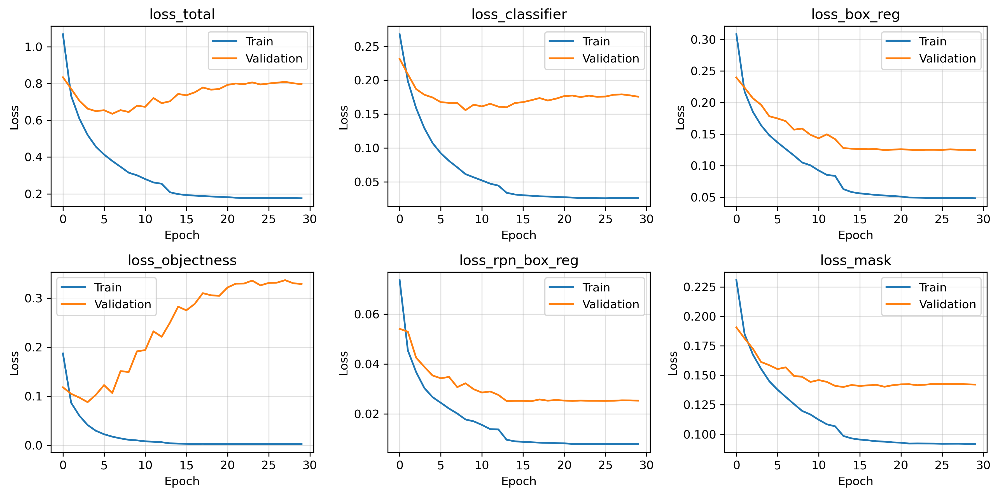

In [26]:
epoch_losses_combined = []

for s in [ 'train', 'valid' ]:
    epoch_losses = {}
    n_batches = np.max( run_metrics[s]['batch'] )
    keys = list( run_metrics[s].keys() )[1:] # Skip the batch number

    # for ign_loss_func in remove_loss_functions:
    #     keys.remove(ign_loss_func)

    # Collect average losses per key per epoch
    for key in keys:
        l = []
        for i in range( len( run_metrics[s][key] ) ):
            l.append( np.mean( run_metrics[s][key][i * n_batches:( i + 1 ) * n_batches] ) )
        epoch_losses[key] = l
    epoch_losses_combined.append( epoch_losses )

# Plot average loss per epoch
fig, ax = plt.subplots( ncols = 3, nrows = 2 )
for i, row in enumerate( ax ):
    for j, col in enumerate( row ):
        col.plot( epoch_losses_combined[0][keys[i*3 + j]] ) # Train Loss
        col.plot( epoch_losses_combined[1][keys[i*3 + j]] ) # Validation Loss
        col.legend( [ 'Train', 'Validation' ] )
        col.set_title( keys[i*3 + j] )
        col.grid( alpha = 0.4 )
        col.set_xlabel( 'Epoch' )
        col.set_ylabel( 'Loss' )
        col.set_xticks( np.arange( 0, EPOCHS + 1, 5 ) )
fig.tight_layout()
plt.show()

In [26]:
np.argsort( epoch_losses_combined[1]['loss_total'] )

array([  44,   49,   43, ..., 2660, 2659, 2658])

In [22]:
path = "training_checkpoints/mask_rcnn_6.blob"
model.load_state_dict( torch.load( path ) )
model.eval()
model.to( device )
print( 'Loaded:', path )

Loaded: training_checkpoints/mask_rcnn_6.blob


/tmp/ipykernel_4486/2571882328.py:2: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict( torch.load( path ) )


In [46]:
predictions = []

import gc


with torch.no_grad():
    bar = tq( data_loader_test, desc = f"Predictions" )
    
    for batch, ( images, targets_batch ) in enumerate( bar, 1 ):
        images = list( image.to( device ) for image in images )

        # Make predictions
        p = model( images )
        # Move predictions to RAM
        p = [ { k: v.to( torch.device( 'cpu' ) ) for k, v in d.items() } for d in p ]

        for prediction in p:
            prediction['ellipse_sparse'] = []
            crater_masks = prediction["masks"].numpy() # shape is n x 1 x 1024 x 1024
            for crater_mask in crater_masks:
                im = crater_mask[0]
                thresh = 0.9
                im[im >= thresh] = 1
                im[im < thresh] = 0
                processed_mask = (im * 255).astype(np.uint8)

                # Extract contours from the processed mask
                contours, _ = cv2.findContours(
                    processed_mask,
                    cv2.RETR_EXTERNAL,  # Retrieve only external contours
                    cv2.CHAIN_APPROX_SIMPLE,  # Simple contour approximation
                )
                # cv2.CHAIN_APPROX_NONE,  # Simple contour approximation
                
                # Overlay contour points on the image
                for contour in contours:
                    if len(contour) >= 5:
                        ellipse = cv2.fitEllipse(contour)
                        (x,y),(a,b),theta = ellipse
                        prediction['ellipse_sparse'].append( [ x, y, a/2, b/2, theta ] )
                        break
            del prediction['masks']
        predictions.extend( p )
        gc.collect()

            


#         # Postprocess mask into ellipse parameters
#         for sample in p:
#             sample['ellipse_sparse'] = []

#             for masks in sample['masks']:
#                 for mask in masks.numpy():
#                     try:
#                         x,y,a,b,theta = get_ellipse_from_mask(mask)
#                         # if not(x==0 and y==0 and b==0 and theta==0):
#                         sample['ellipse_sparse'].append( [ x, y, a, b, theta ] )
#                     except:
#                         print("Error:", mask)
#                         print(mask)
#                         print(len(mask))
#                         print(masks)
#                         print(sample['masks'])
#                         # sample['ellipse_sparse'].append( [] )

#             del sample['masks']
        
#         predictions.extend( p )
#         gc.collect()


Predictions:   0%|          | 0/158 [00:00<?, ?it/s]

Predictions: 100%|██████████| 158/158 [05:24<00:00,  2.05s/it]


tensor([0.9999, 0.9998, 0.9998, 0.9998, 0.9998, 0.9998, 0.9996, 0.9996, 0.9995,
        0.9994, 0.9991, 0.9991, 0.9989, 0.9986, 0.9984, 0.9982, 0.9979, 0.9976,
        0.9975, 0.9973, 0.9961, 0.9953, 0.9951, 0.9947, 0.9945, 0.9815, 0.9791,
        0.9771, 0.9658, 0.9648, 0.9639, 0.9624, 0.9490, 0.9414, 0.9328, 0.9150,
        0.8991, 0.8956, 0.8896, 0.8863, 0.8816, 0.8805, 0.8659, 0.8556, 0.8308,
        0.8028, 0.7974, 0.7719, 0.7594, 0.7501, 0.7219, 0.7091, 0.6947, 0.6900,
        0.6361, 0.6300, 0.5933, 0.5489, 0.5484, 0.5282, 0.5106, 0.5016, 0.4866,
        0.4863, 0.4850, 0.4707, 0.4173, 0.4049, 0.3916, 0.3831, 0.3829, 0.3438,
        0.3417, 0.3319, 0.2782, 0.2585, 0.2339, 0.2280, 0.2169, 0.2035, 0.1860,
        0.1608, 0.1606, 0.1585, 0.1466, 0.1419, 0.1346, 0.1162, 0.1146, 0.0918,
        0.0916, 0.0810, 0.0777, 0.0706, 0.0603, 0.0568, 0.0557])
tensor([1.0000, 0.9999, 0.9999, 0.9999, 0.9998, 0.9998, 0.9998, 0.9997, 0.9993,
        0.9991, 0.9988, 0.9987, 0.9985, 0.9977, 0.9966,

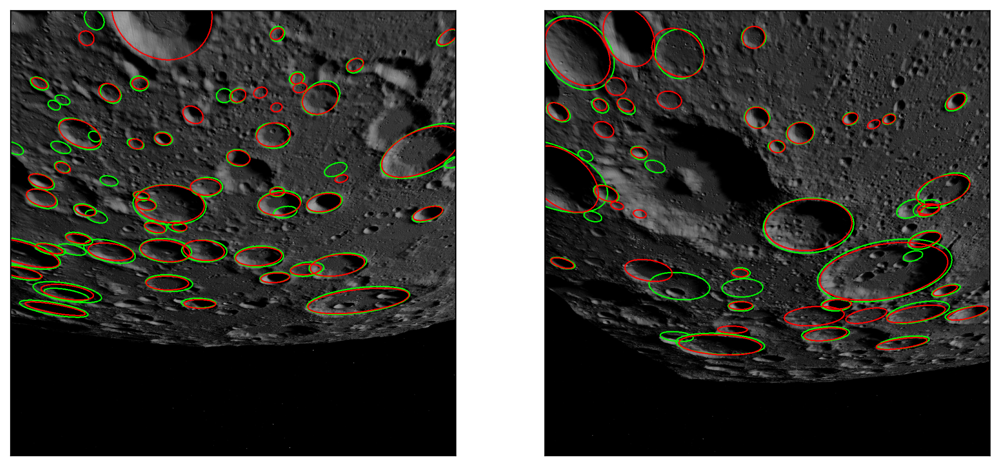

In [ ]:
# Show a random sample of predictions
n_samples = 2
fig, ax = plt.subplots( ncols = n_samples )

pred_threshold = 0.7


for i in range( n_samples ):
    test_set_index = int( np.random.rand() * len( testIndices ) )
    dataset_index = testIndices[test_set_index]
    img, target = cd.__getitem__( dataset_index )
    img = img.numpy()[0]
    img = np.stack( ( img, img, img ), axis = 2 )
    
    # Apply prediction confidence mask
    mask = predictions[test_set_index]['scores'] > 0.7
    mask = np.array(mask)
    print(predictions[test_set_index]['scores'])
    
    # ground truth
    img = plot_masks( img, target['boxes'], target['masks'], color = ( 0, 1, 0 ), color_channel = 1, plot_box = False, plot_mask = False, plot_ellipse = True)

    img = plot_ellipses( img, predictions[test_set_index]['boxes'][mask], np.array(predictions[test_set_index]['ellipse_sparse'])[mask], color = ( 1, 0, 0 ), plot_boxes=False )

    ax[i].imshow( img )
    ax[i].set_xticks( [] )
    ax[i].set_yticks( [] )
    # ax[i].set_title( 'Angle: {angle:d}, Sample: {sample:d}'.format( angle = target['view_angle'][0].item(), sample = target['image_id'].item() ) )
    
plt.show()

In [58]:
# predictions = []

# with torch.no_grad():
#     bar = tq( data_loader_test, desc = f"Test Predictions" )
    
#     for batch, ( images, targets_batch ) in enumerate( bar, 1 ):
#         images = list( image.to( device ) for image in images )

#         # Make predictions
#         p = model( images )

#         # Move predictions to RAM
#         p = [ { k: v.to( torch.device( 'cuda' ) ) for k, v in d.items() } for d in p ]
#         predictions.extend( p )

# # Original version
# predictions = []

# with torch.no_grad():
#     bar = tq( data_loader_test )
#     for batch, ( images, targets ) in enumerate( bar, 1 ):
#         images = list( image.to( device ) for image in images )
#         # targets = [ { k: v.to( device ) for k, v in t.items() } for t in targets ]
#         targets = target_to_device(targets, device)
#         preds = model( images )
#         # Preds is a list of dicts
#         for p in preds:
#             for item in p.values():
#                 # print( item )
#                 item.to( 'cpu' ) # Put each output onto the cpu
#         predictions.extend( preds )
        



# Test version
predictions = []

with torch.no_grad():
    bar = tq( data_loader_test, desc = f"Test Predictions" )
    
    for batch, ( images, targets_batch ) in enumerate( bar, 1 ):
        images = list( image.to( device ) for image in images )

        # Make predictions
        p = model( images )

        # Move predictions to RAM
        p = [ { k: v.to( torch.device( 'cpu' ) ) for k, v in d.items() } for d in p ]

        # Postprocess mask into ellipse parameters
        for sample in p:
            sample['ellipse_sparse'] = []

            for im in sample['masks']:
                im = im.numpy()[0]
                im = np.array( np.round( im ), dtype = np.uint8 )
                threshold = 0.5
                canny_output = cv2.Canny( cv2.merge( ( im, im, im ) ), threshold, threshold * 2 )
                contours, _ = cv2.findContours( canny_output, cv2.RETR_TREE, cv2.CHAIN_APPROX_SIMPLE ) 
                
                for contour in contours:
                    # Hopefully only ever one!
                    if contour.shape[0] > 5:
                        e = cv2.fitEllipse( contour )
                        sample['ellipse_sparse'].append( [ e[0][0], e[0][1], e[1][0], e[1][1], e[2] * math.pi / 180 ] )
                    break
            # Delete masks from prediction to save memory
            del sample['masks']
        
        predictions.extend( p )

Test Predictions: 100%|██████████| 79/79 [03:49<00:00,  2.90s/it]


<class 'torch.Tensor'>
okay
still okay


TypeError: cannot unpack non-iterable NoneType object

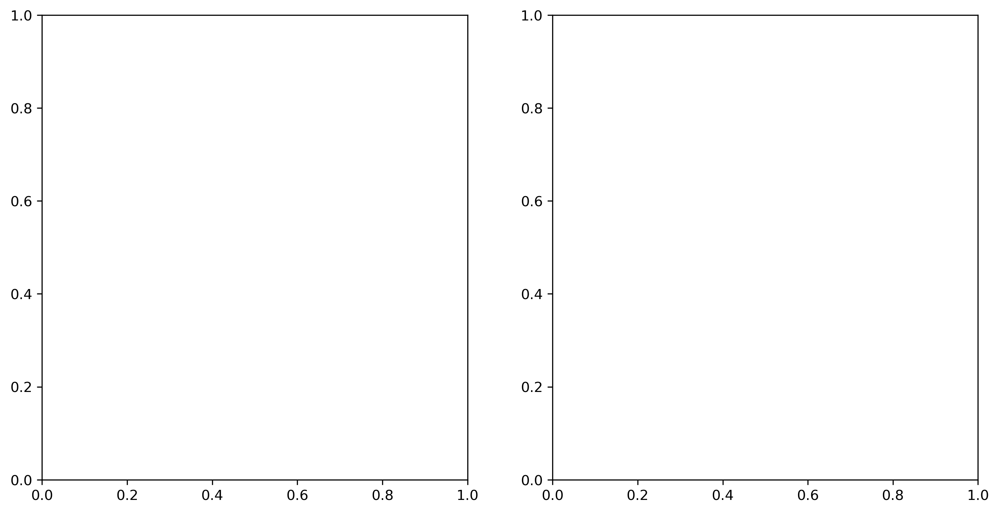

In [59]:
# Show a random sample of predictions
n_samples = 2
fig, ax = plt.subplots( ncols = n_samples )

pred_threshold = 0.7

for i in range( n_samples ):
    test_set_index = int( np.random.rand() * len( testIndices ) )
    dataset_index = testIndices[test_set_index]
    img, target = cd.__getitem__( dataset_index )
    img = img.numpy()[0]
    img = np.stack( ( img, img, img ), axis = 2 )
    
    # Apply prediction confidence mask
    mask = predictions[test_set_index]['scores'] > 0.7
    
    # print("true")
    img = plot_masks( img, target['boxes'], target['masks'], color = ( 0, 1, 0 ), color_channel = 1, plot_box = False, plot_mask = True, plot_ellipse = True)

    # print("pred")
    img = plot_masks( img, predictions[test_set_index]['boxes'][mask], predictions[test_set_index]['masks'][mask].squeeze(1).cpu(), color = ( 1, 0, 0 ), color_channel = 0, plot_box = False, plot_mask = True, plot_ellipse = True )

    ax[i].imshow( img )
    ax[i].set_xticks( [] )
    ax[i].set_yticks( [] )
    # ax[i].set_title( 'Angle: {angle:d}, Sample: {sample:d}'.format( angle = target['view_angle'][0].item(), sample = target['image_id'].item() ) )
    
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [0.0..510.63153].


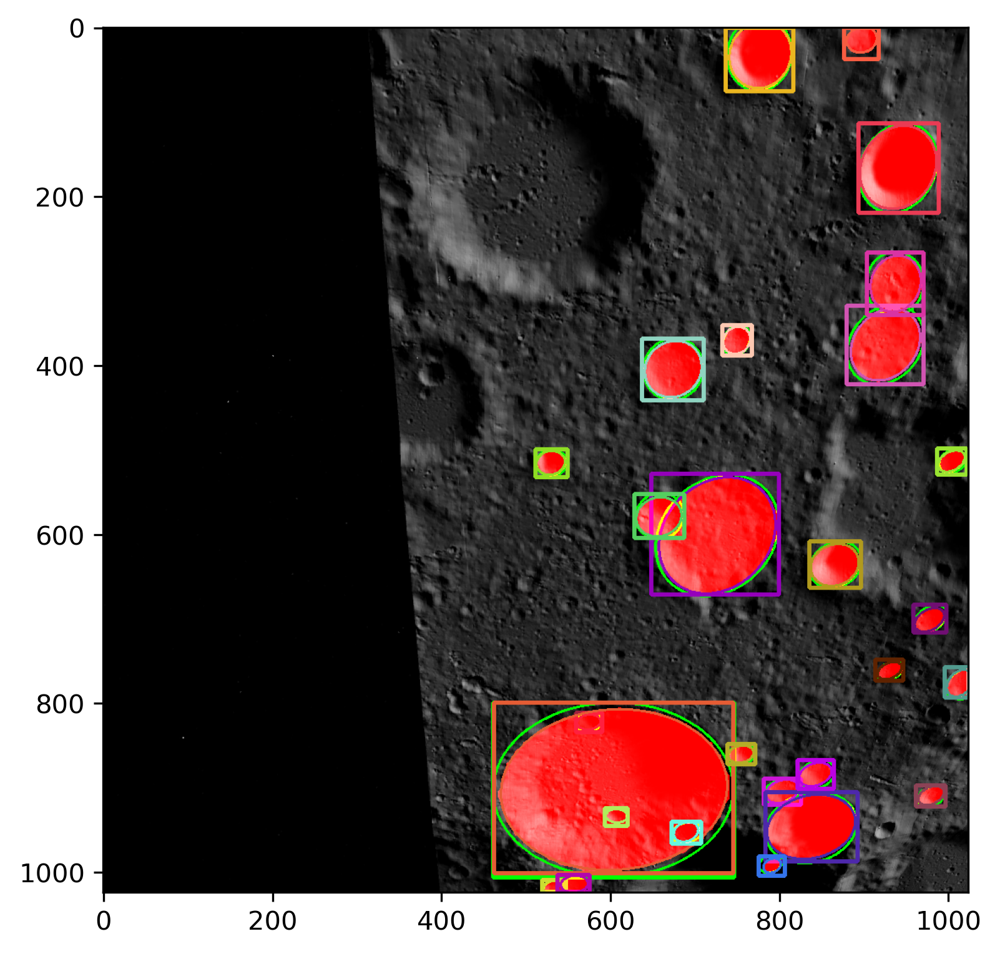

In [50]:

model.eval()
device = torch.device( 'cpu' )
model.to( device )

img, target = cd.__getitem__( 0 ) #2000
img = img.to( device )
target = target_to_device([target], device)

# out = model( img, target )

out = model( img.unsqueeze( 0 ), target )[0]
# print(out)

target = target[0]

img = img.numpy()[0]
img = np.stack( ( img, img, img ), axis = 2 )

# Apply prediction confidence mask
mask = out['scores'] > 0.0


img = plot_ellipses( img, target['boxes'], [target['ellipse_sparse']], color = (0,1,0))

for bbox, mask in zip( out['boxes'][mask], out['masks'][mask] ):
    color = ( np.random.rand(), np.random.rand(), np.random.rand() )

    img = plot_masks( img, [bbox], mask.detach(), color)
    
plt.imshow( img )
plt.show()

In [51]:
plt.rcParams['figure.figsize'] = [6, 6]
plt.rcParams['figure.dpi'] = 200

In [52]:
device = torch.device( 'cpu' )
model.to( device )
model.eval()

print( model.training )

img, target = cd.__getitem__( 10 )
out = model( img.unsqueeze( 0 ).to( device ), [ target ] )[0]
print(out)

img = img.numpy()[0]
img = np.stack( ( img, img, img ), axis = 2 )

# Apply prediction confidence mask
mask = out['scores'] > 0.0

img = plot_ellipses( img, target['boxes'], [target['ellipse_sparse']], color = (0,1,0))

for bbox, ellipse in zip( out['boxes'][mask], out['ellipse_sparse'][mask] ):
    color = ( np.random.rand(), np.random.rand(), np.random.rand() )
    
    cv2.rectangle(
            img,
            ( int( bbox[0] ), int( bbox[1] ) ),
            ( int( bbox[2] ), int( bbox[3] ) ),
            color,
            2,
        )
    
    cv2.ellipse(
        img,
        ( int( ellipse[0].item() ), int( ellipse[1].item() ) ),
        ( int( ellipse[2].item() ), int( ellipse[3].item() ) ),
        ellipse[4].item() * math.pi / 180,
        0, # Start Angle for drawing
        360, # End Angle for drawing
        color,
        2,
    )

plt.imshow( img )
plt.show()

False
{'boxes': tensor([[8.8904e+02, 6.4297e+02, 9.3349e+02, 6.8229e+02],
        [5.3228e+02, 6.2351e+02, 5.7121e+02, 6.5743e+02],
        [8.1508e+02, 5.5446e+02, 9.9957e+02, 6.8964e+02],
        [4.0786e+02, 1.3710e+02, 5.3866e+02, 2.9698e+02],
        [9.1222e+02, 4.2756e+02, 1.0230e+03, 5.6339e+02],
        [2.0956e+02, 1.9377e+02, 2.4791e+02, 2.3202e+02],
        [4.3323e+02, 7.5235e+02, 4.6589e+02, 7.8101e+02],
        [4.0886e+01, 7.9586e+01, 1.8620e+02, 2.3368e+02],
        [8.5546e+02, 7.4431e+02, 8.9066e+02, 7.7426e+02],
        [5.3464e+02, 7.3005e+02, 6.7620e+02, 8.4745e+02],
        [7.8223e+02, 8.6659e+02, 8.1664e+02, 8.9192e+02],
        [9.1017e+01, 7.7798e+02, 1.2319e+02, 8.0610e+02],
        [7.9986e+02, 9.1438e+02, 8.3148e+02, 9.3852e+02],
        [5.8055e+02, 9.0650e+02, 6.2870e+02, 9.4260e+02],
        [4.5393e+02, 7.8951e+02, 4.9222e+02, 8.1917e+02],
        [6.1476e+02, 6.0177e+02, 6.6555e+02, 6.4627e+02],
        [5.4458e+01, 9.0743e+02, 1.1741e+02, 9.5579e+02]

KeyError: 'ellipse_sparse'